In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!rm -rf drive/MyDrive/chest_xray/__MACOSX

!rm -rf drive/MyDrive/chest_xray/chest_xray

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from imutils import paths
from sklearn.model_selection import train_test_split

In [ ]:
def create_df(dir):
    image_dir = list(paths.list_images(dir))
    label = ['Normal' if x.find('NORMAL') > -1 else 'Pneumonia' for x
    in image_dir]
    return pd.DataFrame({ 'paths': image_dir, 'labels': label })

chest_xray_df = create_df('drive/MyDrive/chest_xray')

train, test = train_test_split(chest_xray_df, test_size=0.2, random_state=42)

print('Train data count:')
print('==================')
print(train['labels'].value_counts())
print("\n")
print('Test data count:')
print('================')
print(test['labels'].value_counts())

Train data count:
Pneumonia    3430
Normal       1254
Name: labels, dtype: int64


Test data count:
Pneumonia    843
Normal       329
Name: labels, dtype: int64


In [ ]:
train.head() # Sample train data

,paths,labels
4620,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
3274,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
5724,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
3390,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
113,drive/MyDrive/chest_xray/test/NORMAL/NORMAL2-I...,Normal


In [ ]:
test.head() # Sample test data

,paths,labels
3649,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
4211,drive/MyDrive/chest_xray/train/PNEUMONIA/perso...,Pneumonia
960,drive/MyDrive/chest_xray/train/NORMAL/NORMAL2-...,Normal
23,drive/MyDrive/chest_xray/test/NORMAL/IM-0033-0...,Normal
810,drive/MyDrive/chest_xray/train/NORMAL/IM-0651-...,Normal


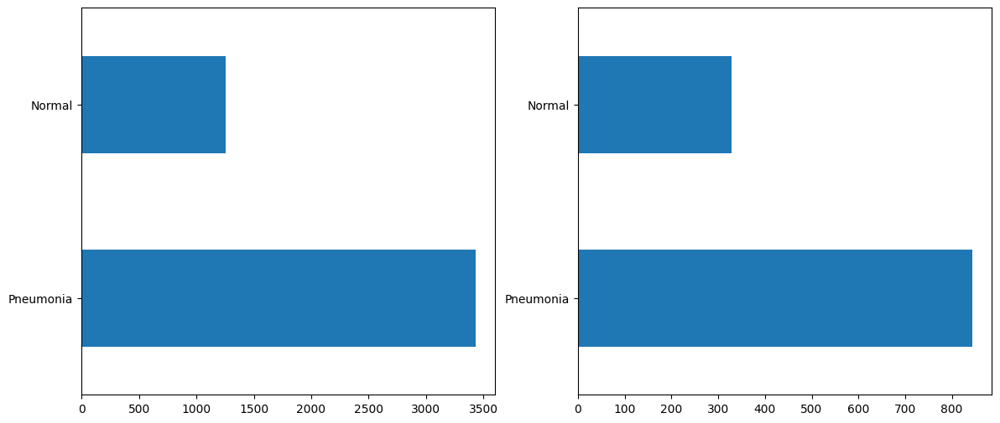

In [ ]:
fig = plt.figure(figsize=(14,6))
for i, x in enumerate([train, test]):
  fig.add_subplot(1, 2, i + 1)
  x['labels'].value_counts().plot(kind='barh')

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def make_generators(train, test, imageSize=256, batchSize=32):
  train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=5, width_shift_range=0.1, height_shift_range=0.1, validation_split=0.2)
  test_datagen = ImageDataGenerator(rescale=1./255)

  basearguments =
   {
      "x_col": 'paths',
      "y_col": 'labels',
      "class_labels": ['Normal', 'Pneumonia'],
      "class_mode": 'binary',
      "target_size": (imageSize, imageSize),
      "batch_size": batchSize,
      "seed": 42
  }

  train_datagen_flow = train_datagen.flow_from_dataframe(**basearguments, dataframe=train,subset='training')

  validation_datagen_flow = train_datagen.flow_from_dataframe(**basearguments, dataframe=train, subset="validation")

  test_datagen_flow = test_datagen.flow_from_dataframe(**basearguments, dataframe=test, shuffle=False)

  return train_datagen_flow, test_datagen_flow, validation_datagen_flow

Found 3748 validated image filenames belonging to 2 classes.
Found 936 validated image filenames belonging to 2 classes.
Found 1172 validated image filenames belonging to 2 classes.


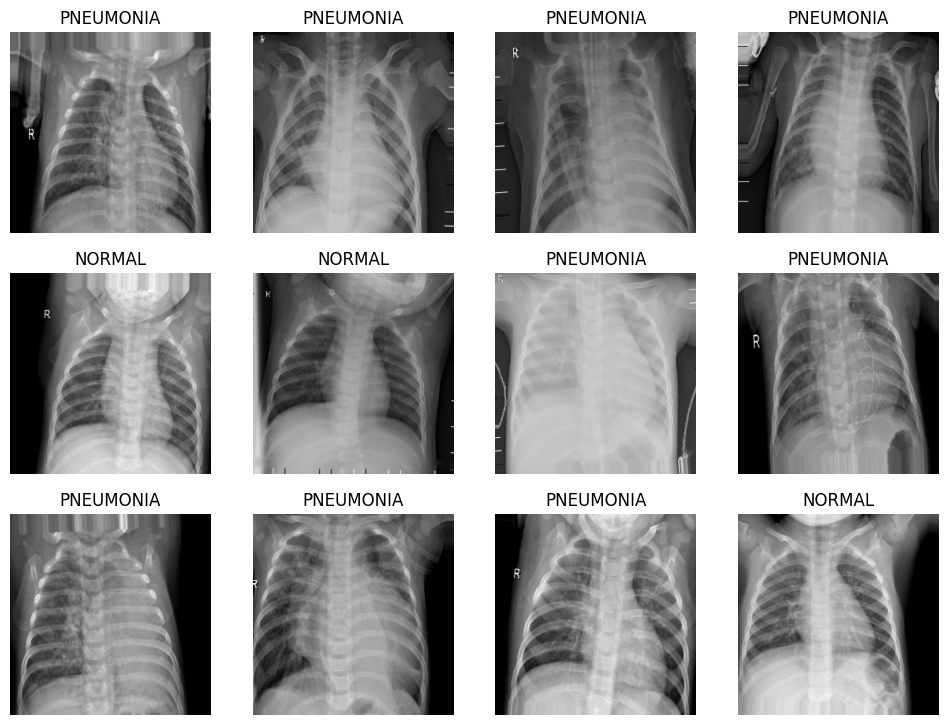

In [ ]:
train_datagen, test_datagen, validation_datagen = make_generators(train, test, 256, 32)
images = train_datagen.next()
fig = plt.figure(figsize=(12,12))

for i in range(12):
  fig.add_subplot(4,4,i+1)
  image = images[0][i]
  label = "NORMAL" if images[1][i] == 0 else "PNEUMONIA"
  plt.axis("off")
  plt.imshow(image)
  plt.title(label)

In [ ]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, TensorBoard, EarlyStopping
from tensorflow.keras.metrics import Recall, Precision, AUC
from tensorflow.keras.applications import VGG16
from tensorflow.keras.utils import plot_model
from datetime import datetime

In [ ]:
def create_smallnet():
  SIZE = 256
  model = Sequential()
  model.add(Conv2D(32, (3, 3), activation="relu", input_shape=(SIZE, SIZE, 3)))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(64, (3, 3), activation="relu"))
  model.add(MaxPooling2D((2, 2)))
  model.add(Conv2D(64, (3, 3), activation="relu"))
  model.add(Flatten())
  model.add(Dense(64, activation="relu"))
  model.add(Dense(1, activation="sigmoid"))

  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', Recall(name='recall'), Precision(name='precision'), AUC(name='auc')])

  return model

In [ ]:
def get_callbacks(model_name):
  logdir = (f'logs/scalars/{model_name}_{datetime.now().strftime("%m%d%Y-%H%M%S")}')
  tensorboard_cb = TensorBoard(log_dir=logdir)

  early_stopping_cb = EarlyStopping(monitor="val_loss", min_delta=1, patience=20, verbose=2, mode="min", restore_best_weights=True)

  checkpoint_cb = ModelCheckpoint(f'model_{model_name}.hdf5', ave_best_only=True, verbose=0, monitor='val_loss', mode='min')

  LearningRate_Scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=3, min_lr=0.000001, verbose=1)

  return [tensorboard_cb, early_stopping_cb, checkpoint_cb, LearningRate_Scheduler]

In [ ]:
def fit_model(train_datagen, validation_datagen, model_name, batch_size=32, epochs=15):

  if model_name == 'smallnet':
    model = create_smallnet()

  model.summary()
  plot_model(model, to_file=model_name + '.jpg', show_shapes=True)

  model_history = model.fit(train_datagen, validation_data=validation_datagen, steps_per_epoch=train_datagen.n/batch_size, validation_steps=validation_datagen.n/batch_size, epochs=epochs, verbose=1, callbacks=get_callbacks(model_name))

  return model, model_history

In [ ]:
smallnet_model, smallnet_model_hist = fit_model(train_datagen, validation_datagen, 'smallnet', epochs=15)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)        36928     
                                                                 
 flatten (Flatten)           (None, 230400)            0

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


117/117 [==============================] - 568s 4s/step - loss: 0.5520 - accuracy: 0.8119 - recall: 0.9167 - precision: 0.8411 - auc: 0.8413 - val_loss: 0.3220 - val_accuracy: 0.8526 - val_recall: 0.9853 - val_precision: 0.8400 - val_auc: 0.9453 - lr: 0.0010
Epoch 2/15
117/117 [==============================] - 146s 1s/step - loss: 0.2522 - accuracy: 0.8997 - recall: 0.9298 - precision: 0.9332 - auc: 0.9488 - val_loss: 0.2360 - val_accuracy: 0.9124 - val_recall: 0.9501 - val_precision: 0.9310 - val_auc: 0.9598 - lr: 0.0010
Epoch 3/15
117/117 [==============================] - 145s 1s/step - loss: 0.2113 - accuracy: 0.9160 - recall: 0.9451 - precision: 0.9406 - auc: 0.9635 - val_loss: 0.2527 - val_accuracy: 0.9006 - val_recall: 0.9809 - val_precision: 0.8932 - val_auc: 0.9618 - lr: 0.0010
Epoch 4/15
117/117 [==============================] - 144s 1s/step - loss: 0.2034 - accuracy: 0.9221 - recall: 0.9458 - precision: 0.9478 - auc: 0.9656 - val_loss: 0.2249 - val_accuracy: 0.9071 - val_r

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf

def create_VGGnet():
  '''
  Second Model - CNN (VGG16)
  '''
  SIZE = 256
  # Instantiates the VGG16 model
  vgg16_mdl = VGG16(weights = 'imagenet',
            include_top = False,
            input_shape = (SIZE, SIZE, 3))
  for layer in vgg16_mdl.layers:
    layer.trainable = False

  x = Flatten()(vgg16_mdl.output)
  x = Dense(4096, activation="relu")(x)
  x = Dense(1072, activation="relu")(x)
  x = Dropout(0.2)(x)
  predictions = Dense(1, activation="sigmoid")(x)

  model = tf.keras.Model(inputs=vgg16_mdl.input, outputs=predictions)

  # Compile the network using Adam optimizer, and then run
  model.compile(optimizer='adam',
                loss='binary_crossentropy',
                metrics=['accuracy', Recall(name='recall'),
                         Precision(name='precision'),
                         AUC(name='auc')])
  return model

In [ ]:
def fit_model(train_datagen, validation_datagen, model_name, batch_size=32, epochs=15, model_fname=None):
  '''
  fit_model method to train or continue training the model (either VGG or smallnet).
  '''
  if model_fname == None:
    if model_name == 'smallnet':
      model = create_smallnet()
    if model_name == 'VGG':
      model = create_VGGnet()
    model.summary()
    plot_model(model, to_file=model_name + '.jpg', show_shapes=True)
  else:
    model = load_model(model_fname)
  model_history = model.fit(train_datagen,
                            validation_data=validation_datagen,
                            steps_per_epoch=train_datagen.n/batch_size,
                            validation_steps=validation_datagen.n/batch_size,
                            epochs=epochs,
                            verbose=1,
                            callbacks=get_callbacks(model_name))
  return model, model_history

In [ ]:
# Train the model
vgg_model, vgg_model_hist = fit_model(train_datagen,
                                      validation_datagen,
                                      'VGG', epochs=15)

58889256/58889256 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                              

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


117/117 [==============================] - 178s 1s/step - loss: 0.9292 - accuracy: 0.8911 - recall: 0.9239 - precision: 0.9273 - auc: 0.9196 - val_loss: 0.1606 - val_accuracy: 0.9498 - val_recall: 0.9780 - val_precision: 0.9542 - val_auc: 0.9786 - lr: 0.0010
Epoch 2/15
117/117 [==============================] - 172s 1s/step - loss: 0.1319 - accuracy: 0.9538 - recall: 0.9698 - precision: 0.9673 - auc: 0.9845 - val_loss: 0.1827 - val_accuracy: 0.9359 - val_recall: 0.9912 - val_precision: 0.9260 - val_auc: 0.9804 - lr: 0.0010
Epoch 3/15
117/117 [==============================] - 169s 1s/step - loss: 0.1332 - accuracy: 0.9498 - recall: 0.9687 - precision: 0.9631 - auc: 0.9849 - val_loss: 0.1269 - val_accuracy: 0.9594 - val_recall: 0.9677 - val_precision: 0.9763 - val_auc: 0.9873 - lr: 0.0010
Epoch 4/15
117/117 [==============================] - 167s 1s/step - loss: 0.1070 - accuracy: 0.9621 - recall: 0.9745 - precision: 0.9738 - auc: 0.9896 - val_loss: 0.1387 - val_accuracy: 0.9551 - val_r

In [ ]:
def model_plot_history(history):
  fig = plt.figure(figsize = (20 , 7))
  fig.add_subplot(1,2,1)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.xlabel('epoch')
  plt.ylabel('loss')
  plt.legend(['train loss', 'valid loss'])
  plt.grid(True)
  plt.plot()
  fig.add_subplot(1,2,2)
  plt.plot(history.history['accuracy'])
  plt.plot(history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.xlabel('epoch')
  plt.ylabel('accuracy')
  plt.legend(['train acc', 'valid acc'])
  plt.grid(True)
  plt.plot()

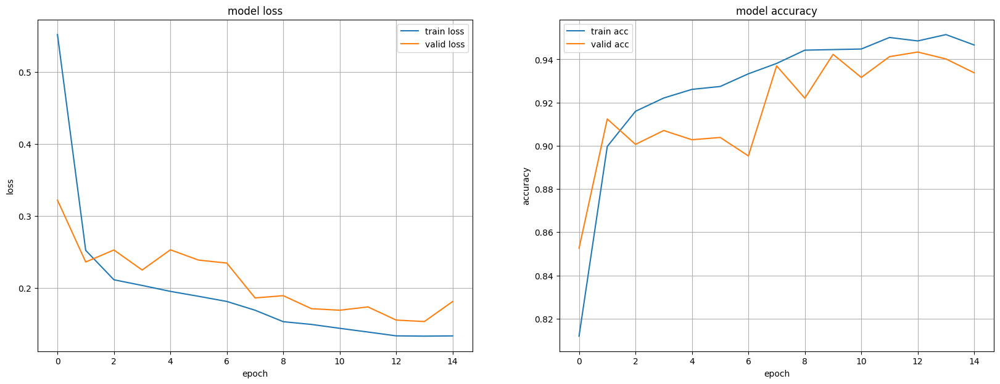

In [ ]:
model_plot_history(smallnet_model_hist)

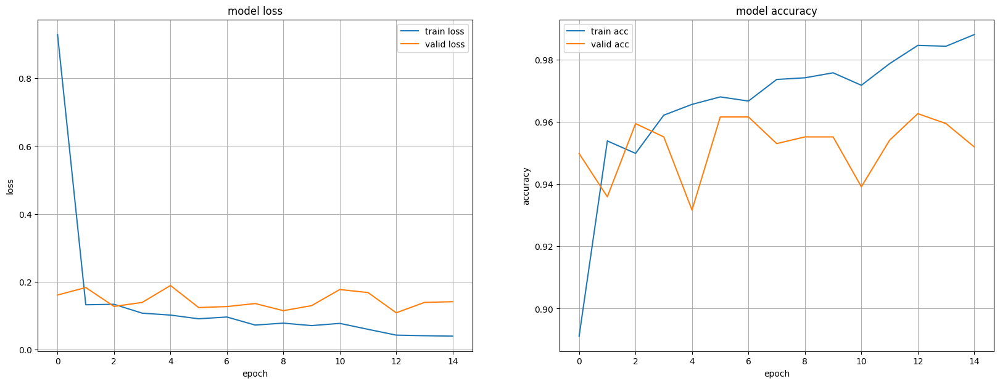

In [ ]:
model_plot_history(vgg_model_hist)

In [ ]:
!git clone https://github.com/gkeechin/vizgradcam.git

Cloning into 'vizgradcam'...
remote: Enumerating objects: 67, done.
remote: Counting objects: 100% (67/67), done.
remote: Compressing objects: 100% (61/61), done.
remote: Total 67 (delta 32), reused 24 (delta 6), pack-reused 0
Receiving objects: 100% (67/67), 1.08 MiB | 17.89 MiB/s, done.
Resolving deltas: 100% (32/32), done.


In [ ]:
!cp vizgradcam/gradcam.py gradcam.py

In [ ]:
from gradcam import VizGradCAM

In [ ]:
def GradCAM_visualization(model, test_datagen):
  images = test_datagen.next()
  fig = plt.figure(figsize=(16,6))

  for x in range(3):
    fig.add_subplot(1,3,x+1)
    image = images[0][x]
    label = 'PNEUMONIA' if images[1][x] == 1 else 'NORMAL'
    VizGradCAM(model, image, plot_results=True, interpolant=0.5)
    probability_output = model.predict(image.reshape(1,256,256,3))[0][0]
    title = f"Prediction: {'PNEUMONIA' if probability_output > 0.5 else 'NORMAL'}\n"
    title += f"Probabilty of Pneumonia: {probability_output}\n"
    title += f"True Label: {label}\n"
    plt.title(title)

1/1 [==============================] - 0s 29ms/step


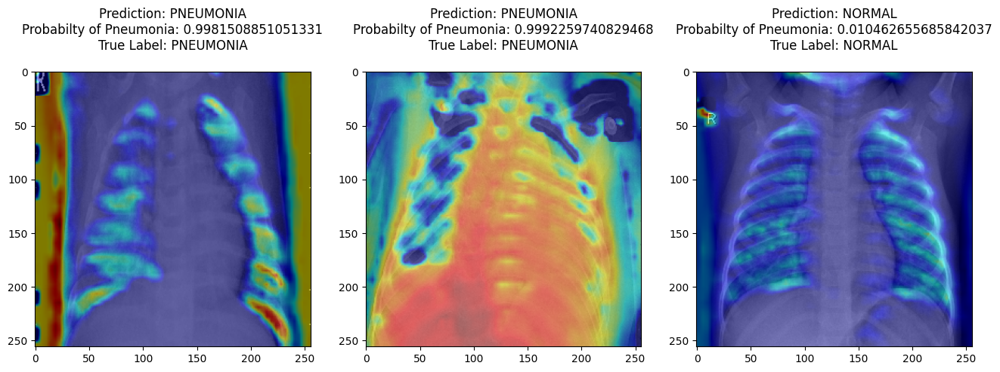

In [ ]:
GradCAM_visualization(smallnet_model, test_datagen)

1/1 [==============================] - 0s 21ms/step


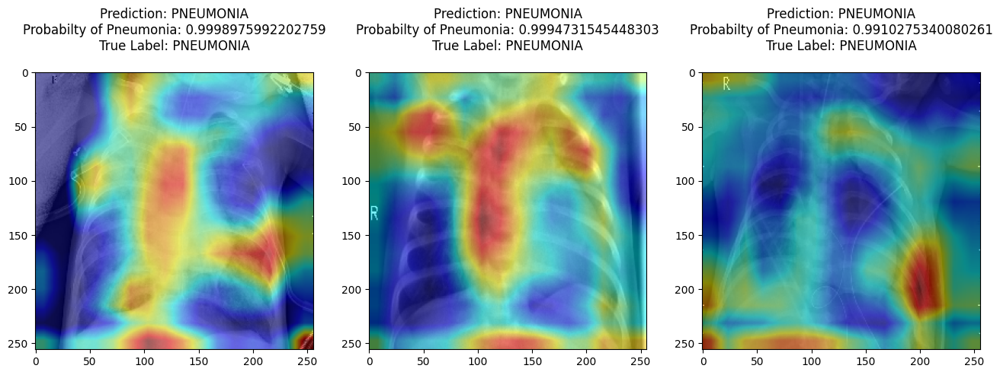

In [ ]:
GradCAM_visualization(vgg_model, test_datagen)

In [ ]:
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix, ConfusionMatrixDisplay

In [ ]:
def evaluate_model(model, generator, model_name):
  preds = model.predict(generator)
  prediction_classes = [1 if x >= 0.5 else 0 for x in preds]
  trueValues = generator.classes
  print("CLASSIFICATION REPORT")
  print(classification_report(trueValues, prediction_classes, target_names=['Normal','Pneumonia']))
  conf_mat = confusion_matrix(trueValues, prediction_classes)
  disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat, display_labels=['Normal','Pneumonia'])
  disp.plot(values_format='')
  fpr, tpr, thresholds = roc_curve(trueValues, preds)
  auc_val = auc(fpr, tpr)
  print(f"AUC is for {model_name}:", auc_val)

In [ ]:
small_model_load = load_model('model_smallnet.hdf5')
vgg_model_load = load_model('model_VGG.hdf5')

37/37 [==============================] - 106s 3s/step
CLASSIFICATION REPORT
              precision    recall  f1-score   support

      Normal       0.97      0.85      0.91       329
   Pneumonia       0.95      0.99      0.97       843

    accuracy                           0.95      1172
   macro avg       0.96      0.92      0.94      1172
weighted avg       0.95      0.95      0.95      1172

AUC is for smallnet: 0.9876941160351473


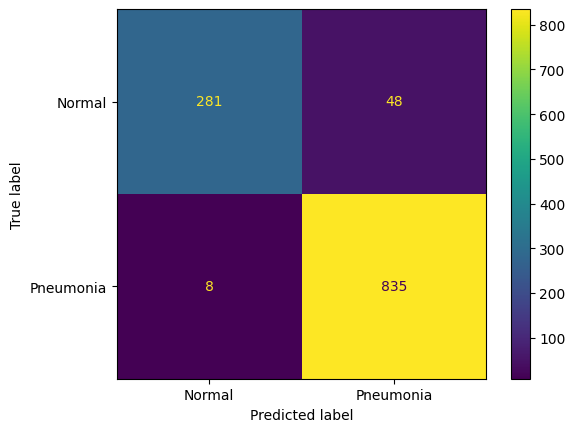

In [ ]:
evaluate_model(small_model_load, test_datagen, "smallnet")

37/37 [==============================] - 22s 589ms/step
CLASSIFICATION REPORT
              precision    recall  f1-score   support

      Normal       0.97      0.95      0.96       329
   Pneumonia       0.98      0.99      0.98       843

    accuracy                           0.98      1172
   macro avg       0.97      0.97      0.97      1172
weighted avg       0.98      0.98      0.98      1172

AUC is for VGG: 0.9964484923218928


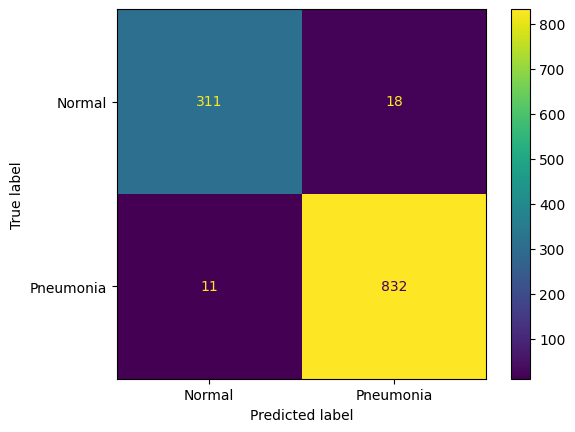

In [ ]:
evaluate_model(vgg_model_load, test_datagen, "VGG")

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

In [ ]:
def predict_image(model, image_path):
  image = img_to_array(load_img(image_path, target_size=(256,256,3)))
  image = image * (1./255)
  plt.imshow(image)
  image = np.expand_dims(image, axis=0)
  predictions = model.predict(image)
  label = 'PNEUMONIA' if predictions >= 0.5 else 'NORMAL'
  print("Prediction is: ", "\033[1m" + label, "\033[0m")
  print("Probability of Pneumonia is: ", "\033[1m", predictions[0][0], "\033[0m", "OR", "\033[1m", "{:.4f}".format(predictions[0][0]*100), "%", "\033[0m")

1/1 [==============================] - 0s 120ms/step
Prediction is:  NORMAL 
Probability of Pneumonia is:   0.0013743574  OR  0.1374 % 


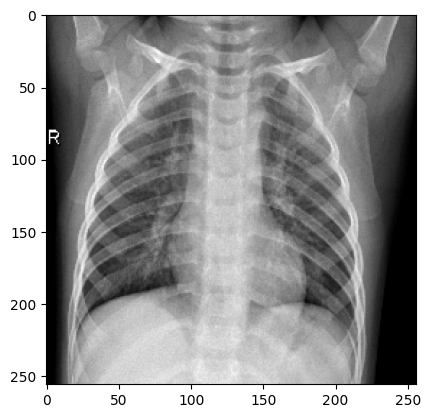

In [ ]:
smallnet_predict = load_model('model_smallnet.hdf5')
predict_image(smallnet_predict, 'drive/MyDrive/chest_xray/train/NORMAL/IM-0410-0001.jpeg')

1/1 [==============================] - 0s 165ms/step
Prediction is:  NORMAL 
Probability of Pneumonia is:   0.00059419364  OR  0.0594 % 


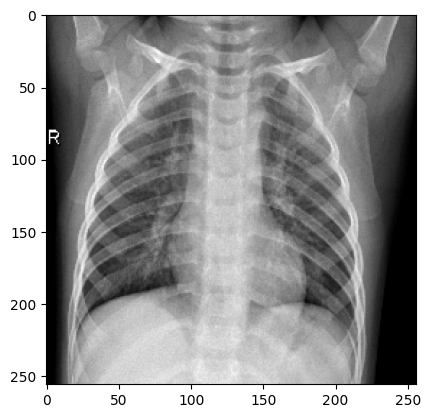

In [ ]:
vgg_predict = load_model('model_VGG.hdf5')
predict_image(vgg_predict, 'drive/MyDrive/chest_xray/train/NORMAL/IM-0410-0001.jpeg')

1/1 [==============================] - 0s 78ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99520254  OR  99.5203 % 


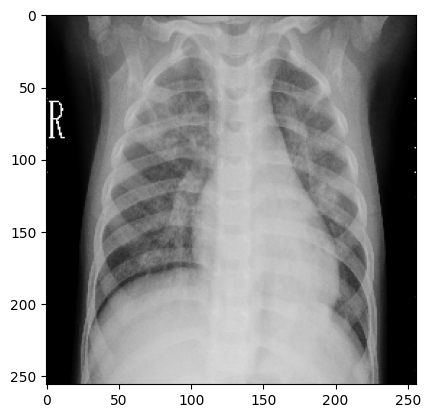

In [ ]:
smallnet_predict = load_model('model_smallnet.hdf5')
predict_image(smallnet_predict, 'drive/MyDrive/chest_xray/train/PNEUMONIA/person1009_virus_1694.jpeg')

1/1 [==============================] - 0s 186ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.9320802  OR  93.2080 % 


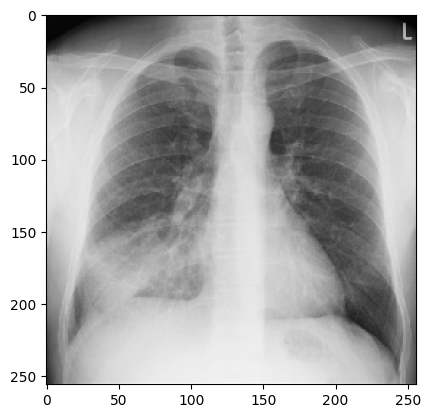

In [ ]:
vgg_predict = load_model('model_VGG.hdf5')
predict_image(vgg_predict, '/content/drive/MyDrive/PNEUMONIA_POSITIVE_SAMPLE/PNEUMONIA SAMPLE 1.jpeg')

1/1 [==============================] - 0s 87ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.8104614  OR  81.0461 % 


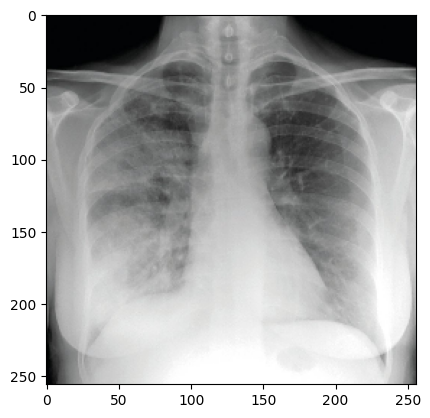

In [ ]:
smallnet_predict = load_model('model_smallnet.hdf5')
predict_image(smallnet_predict, '/content/drive/MyDrive/PNEUMONIA_POSITIVE_SAMPLE/PNEUMONIA SAMPLE 3.jpeg')

1/1 [==============================] - 0s 160ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99921966  OR  99.9220 % 


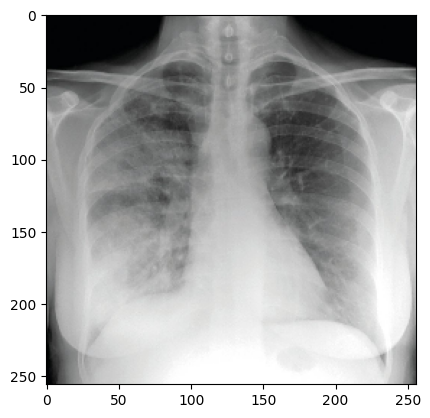

In [ ]:
vgg_predict = load_model('model_VGG.hdf5')
predict_image(vgg_predict, '/content/drive/MyDrive/PNEUMONIA_POSITIVE_SAMPLE/PNEUMONIA SAMPLE 3.jpeg')

1/1 [==============================] - 0s 364ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99936455  OR  99.9365 % 


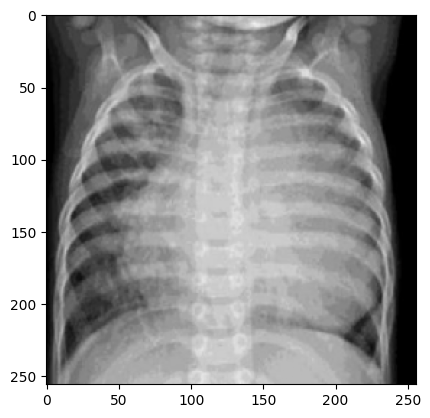

In [ ]:
smallnet_predict = load_model('model_smallnet.hdf5')
predict_image(smallnet_predict, 'e.png')

In [ ]:
smallnet_predict = load_model('model_smallnet.hdf5')
predict_image(smallnet_predict, '/content/drive/MyDrive/NORMAL IMG SAMPLE/NORMAL IMAGE 2.jpg')

1/1 [==============================] - 0s 178ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99999106  OR  99.9991 % 


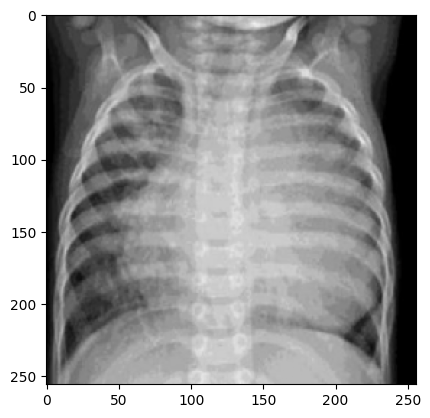

In [ ]:
vgg_predict = load_model('model_VGG.hdf5')
predict_image(vgg_predict, 'e.png')

In [ ]:
vgg_predict = load_model('model_VGG.hdf5')
predict_image(vgg_predict, '/content/drive/MyDrive/NORMAL IMG SAMPLE/NORMAL IMAGE 2.jpg')

### SAVING THE MODELS

In [1]:
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

In [2]:
smallnet_model_load = load_model('model_smallnet.hdf5')
smallnet_model_load.save('/content/drive/MyDrive/smallnet_Model_Saved')

NameError: name 'load_model' is not defined

In [ ]:
vgg_model_load = load_model('model_VGG.hdf5')
vgg_model_load.save('/content/drive/MyDrive/VGG_Model_Saved')

### LOAD THE MODELS

In [ ]:
from tensorflow import keras
VGG_loaded_model = keras.models.load_model('/content/drive/MyDrive/VGG_Model_Saved')
smallnet_loaded_model = keras.models.load_model('/content/drive/MyDrive/smallnet_Model_Saved')

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import numpy as np

def predict_image(model, image_path):
  image = img_to_array(load_img(image_path, target_size=(256,256,3)))
  image = image * (1./255)
  plt.imshow(image)
  image = np.expand_dims(image, axis=0)
  predictions = model.predict(image)
  label = 'PNEUMONIA' if predictions >= 0.5 else 'NORMAL'
  print("Prediction is: ", "\033[1m" + label, "\033[0m")
  print("Probability of Pneumonia is: ", "\033[1m", predictions[0][0], "\033[0m", "OR", "\033[1m", "{:.4f}".format(predictions[0][0]*100), "%", "\033[0m")

1/1 [==============================] - 0s 35ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99936455  OR  99.9365 % 


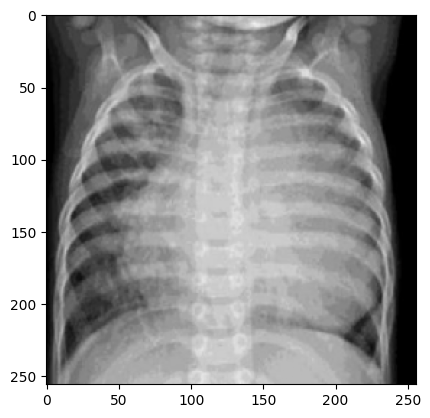

In [ ]:
# IDK IF THIS IS RIGHT, SO YOU WILL HAVE TO DOUBLE CHECK

# Predict from the smallnet loaded model
predict_image(smallnet_loaded_model, 'drive/MyDrive/PNEUMONIA_POSITIVE_SAMPLE/norm.jpg')

1/1 [==============================] - 0s 167ms/step
Prediction is:  PNEUMONIA 
Probability of Pneumonia is:   0.99921966  OR  99.9220 % 


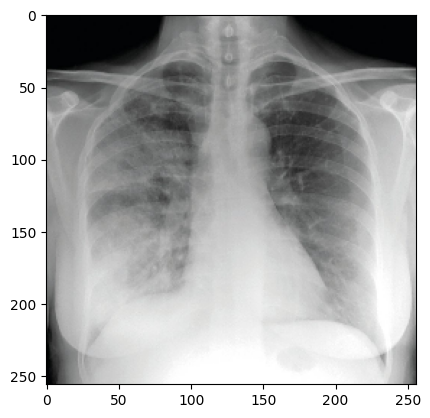

In [ ]:
# Predict from the VGG loaded model
predict_image(VGG_loaded_model, 'drive/MyDrive/PNEUMONIA_POSITIVE_SAMPLE/PNEUMONIA SAMPLE 3.jpeg')